# Image Analysis and Processing — Assignment 1
**All 7 exercises in a single notebook.**  
Each cell is self-contained: load the image → process → display.  
Run the setup cell first, then any exercise independently.


## Setup
Install missing libraries once, then import everything needed.


In [1]:
# Install if needed (comment out after first run)
import subprocess, sys
subprocess.run([sys.executable, '-m', 'pip', 'install', '-q',
                'opencv-python', 'matplotlib', 'scikit-image'], check=True)


CompletedProcess(args=['/Users/giorgos.boulogeorgos/Documents/image_processing_and_analysis/assignment_1/.venv/bin/python', '-m', 'pip', 'install', '-q', 'opencv-python', 'matplotlib', 'scikit-image'], returncode=0)

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from skimage import filters, feature, morphology
from scipy import ndimage
from sklearn.cluster import DBSCAN

# Point to Documents folder where images are stored
IMAGE_DIR = os.path.join(os.getcwd(), 'Documents')

def show(*imgs_titles, cmap=None, figsize=None):
    """Display one or more (image, title) pairs side-by-side."""
    n = len(imgs_titles) // 2
    fw = figsize or (6 * n, 5)
    fig, axes = plt.subplots(1, n, figsize=fw)
    if n == 1: axes = [axes]
    for ax, img, title in zip(axes, imgs_titles[::2], imgs_titles[1::2]):
        if img.ndim == 2:
            ax.imshow(img, cmap=cmap or 'gray', vmin=0, vmax=255)
        else:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(title, fontsize=12)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

print('Setup complete.')


Setup complete.


---
## Exercise 1 — Step Transformation Function

### What the function is

The `step_fun.png` shows a **piecewise-constant (step) function** — a gray-level transformation that maps every input intensity to one of exactly 8 fixed output levels. The full 256-level input scale is partitioned into 8 consecutive ranges; every pixel whose value falls in a given range is forced to the same single output value:

| Input range | Output value |
|---|---|
| 0 – 30 | 10 |
| 31 – 60 | 20 |
| 61 – 90 | 50 |
| 91 – 120 | 70 |
| 121 – 160 | 100 |
| 161 – 190 | 140 |
| 191 – 220 | 180 |
| 221 – 255 | 200 |

### Visual and tonal effects

Applying this function has four observable consequences:

1. **Posterization.** Many distinct input levels collapse to the same output. Smooth    gradients in the original (e.g. a shadow gradually fading across a surface) become    flat, uniform patches. The image looks like a limited-colour painting.
2. **Overall darkening.** Notice that the *maximum* output value is 200, not 255. The    step function lies *below* the identity line (y = x) everywhere on the graph. No    pixel can become brighter than 200, so the image as a whole is darker than the    original.
3. **Reduced dynamic range.** Instead of the natural 0–255 span, the output only uses    values from {10, 20, 50, 70, 100, 140, 180, 200}. The tonal range is compressed    from 255 levels down to 8 distinct shades, reducing perceived depth and detail.
4. **Loss of fine tonal gradations.** Any subtle difference in input value within the    same range is erased. Two pixels at intensities 65 and 88 both map to 50 and become    indistinguishable. This destroys texture and smooth shading within each band.

### Why we use a Look-Up Table (LUT)

A naive implementation would loop over every pixel, apply a chain of `if/elif` comparisons, and write the result. For a 500×430 image that is 215,000 conditional checks, this would be slow in Python. A **LUT** avoids this entirely: we pre-compute a 256-element array where `lut[r]` is the output for any input value `r`. Applying it to the image is then a single array-indexing operation — `cv2.LUT(image, lut)` — which runs at hardware speed in O(n) time with no Python loops. The LUT is built once by iterating over the 8 breakpoints and filling the array from each breakpoint onwards, which is simpler and less error-prone than writing nested conditions.


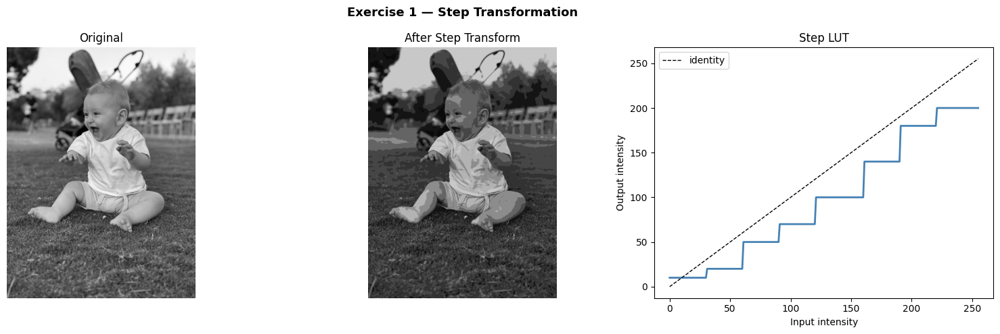

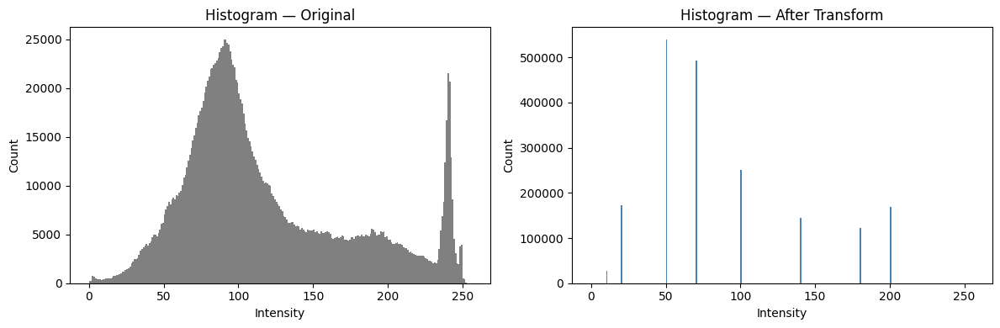

Output histogram shows 8 discrete spikes — one per LUT output level.


In [3]:
# --- Build the LUT from the step function graph ---
lut = np.zeros(256, dtype=np.uint8)
breakpoints = [(0,10),(31,20),(61,50),(91,70),(121,100),(161,140),(191,180),(221,200)]
for start, out_val in breakpoints:
    lut[start:] = out_val        # fill from this breakpoint onwards

# Choose a test image with a wide tonal range
src = cv2.imread(os.path.join(IMAGE_DIR, '1000020113.jpg'), cv2.IMREAD_GRAYSCALE)
result = cv2.LUT(src, lut)

# Plot the LUT curve alongside input/output images
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
axes[0].imshow(src, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original', fontsize=12); axes[0].axis('off')
axes[1].imshow(result, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('After Step Transform', fontsize=12); axes[1].axis('off')
axes[2].plot(lut, color='steelblue', lw=2)
axes[2].plot([0,255],[0,255],'k--',lw=1,label='identity')
axes[2].set_xlabel('Input intensity'); axes[2].set_ylabel('Output intensity')
axes[2].set_title('Step LUT'); axes[2].legend()
plt.suptitle('Exercise 1 — Step Transformation', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# Compare histograms
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(src.ravel(), 256, [0,256], color='gray')
axes[0].set_title('Histogram — Original')
axes[1].hist(result.ravel(), 256, [0,256], color='steelblue')
axes[1].set_title('Histogram — After Transform')
for ax in axes: ax.set_xlabel('Intensity'); ax.set_ylabel('Count')
plt.tight_layout(); plt.show()
print('Output histogram shows 8 discrete spikes — one per LUT output level.')


---
## Exercise 2 — Enhance `nature_dark_forest.jpg` (Light)

### What is wrong with the image

The image is **severely underexposed**: the histogram of the luminance channel is heavily concentrated below intensity 80, meaning most of the image is dark. Forest details in the shadows are almost invisible.

### Why simple brightening approaches are not enough

The most obvious fix — multiplying pixel values by a constant, or applying a bright gamma curve — has a critical flaw: it acts **uniformly across the entire image**. In this scene the sky and any light patches near the canopy are *already* close to 255. A uniform boost pushes them past 255, causing **clipping** (they all become pure white and lose all detail). Meanwhile the deepest shadows, starting near 0, still only move a small absolute amount. Pure gamma correction is appropriate for an image that is uniformly too dark everywhere; it is a poor fit when parts of the scene have very different exposure levels.

We nevertheless **explore gamma first** (sweeping γ ∈ {0.5, 1.5, 2.5}) as a calibration step. γ < 1 darkens, γ > 1 brightens. The sweep makes the sky blow-out problem visible and confirms that we need a *locally adaptive* method instead.

### Why CLAHE on the L channel of LAB

**Why the LAB colour space?**
LAB is a perceptually uniform colour space that separates luminance (L) from two chromatic channels: A (green–red axis) and B (blue–yellow axis). The critical property is that L encodes *only* perceived brightness — it contains no colour information at all. This means we can modify L without changing the hue or saturation of any pixel. If we enhanced brightness directly in RGB, any multiplication or offset would shift all three channels by different amounts, distorting colours. Working in LAB eliminates that risk entirely.

**Why CLAHE rather than global histogram equalization?**
Global histogram equalization (HEQ) transforms the intensity distribution so that the output histogram is approximately flat across all 256 levels. This maximises contrast globally but treats the entire image as one unit — it cannot distinguish a dark forest floor from a bright canopy. The result is often an unnatural "HDR-like" appearance where local gradients are destroyed.

CLAHE (Contrast Limited Adaptive Histogram Equalization) solves this by operating on **small local tiles** (here 8×8 tiles across the image). Within each tile the histogram is equalized independently, adapting to local illumination. The tiles are then blended bilinearly at their boundaries to avoid visible seams. The key addition over AHE (plain adaptive HE) is the **clip limit**: it caps the height of any histogram bin before redistribution. Without this limit, a tile that contains mostly one intensity level would map that level to a very wide output range, enormously amplifying noise. The clip limit (set to 3.0 here) prevents this by truncating the excess and distributing it uniformly. The result is a natural-looking enhancement that lifts shadows while protecting already-bright areas from over-exposure.


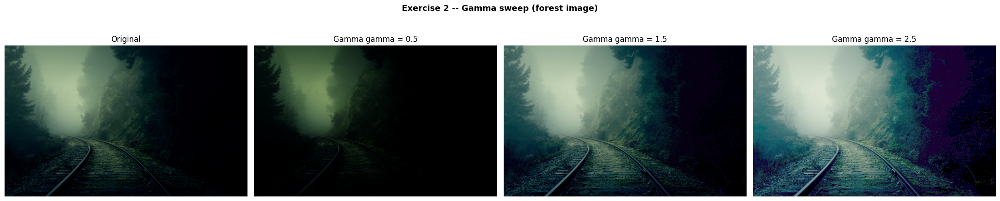

gamma=0.5 darkens the image, gamma=2.5 over-brightens the sky.


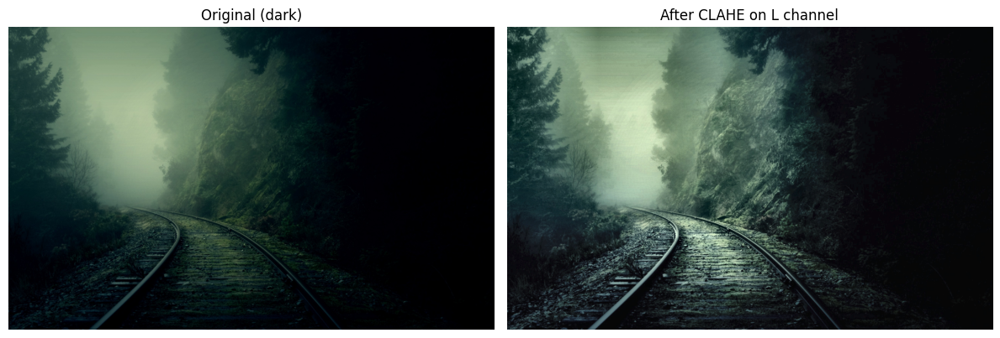

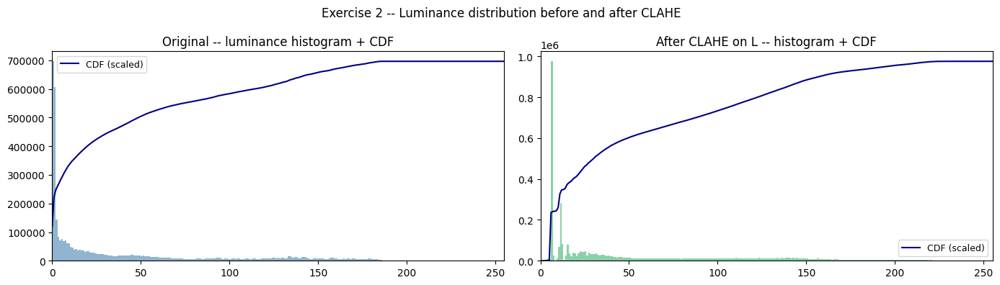

After CLAHE: shadows lifted, sky not clipped.


In [4]:
img = cv2.imread(os.path.join(IMAGE_DIR, 'nature_dark_forest.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# ---- Step 1: Gamma sweep ----
def apply_gamma_bgr(image_bgr, gamma):
    inv_gamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)], dtype=np.uint8)
    return cv2.LUT(image_bgr, table)

gamma_vals = [0.5, 1.5, 2.5]
gamma_imgs = [apply_gamma_bgr(img, g) for g in gamma_vals]

fig, axes = plt.subplots(1, 4, figsize=(22, 5))
axes[0].imshow(img_rgb); axes[0].set_title('Original'); axes[0].axis('off')
for ax, g, gi in zip(axes[1:], gamma_vals, gamma_imgs):
    ax.imshow(cv2.cvtColor(gi, cv2.COLOR_BGR2RGB))
    ax.set_title(f'Gamma gamma = {g}'); ax.axis('off')
plt.suptitle('Exercise 2 -- Gamma sweep (forest image)', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print('gamma=0.5 darkens the image, gamma=2.5 over-brightens the sky.')

# ---- Step 2: CLAHE on L channel (LAB) ----
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
L, A, B = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
L_eq = clahe.apply(L)
enhanced = cv2.cvtColor(cv2.merge([L_eq, A, B]), cv2.COLOR_LAB2BGR)

show(img, 'Original (dark)', enhanced, 'After CLAHE on L channel', figsize=(12, 6))

# ---- Histogram + CDF comparison ----
def plot_hist_cdf(ax, image_gray, title, color='steelblue'):
    h, _ = np.histogram(image_gray.ravel(), 256, [0, 256])
    cdf = h.cumsum()
    cdf_norm = cdf * h.max() / cdf.max()
    ax.hist(image_gray.ravel(), 256, [0, 256], color=color, alpha=0.6)
    ax.plot(cdf_norm, color='navy', linewidth=1.5, label='CDF (scaled)')
    ax.set_title(title); ax.set_xlim(0, 255); ax.legend(fontsize=9)

gray_orig2    = cv2.cvtColor(img,      cv2.COLOR_BGR2GRAY)
gray_enhanced = cv2.cvtColor(enhanced, cv2.COLOR_BGR2GRAY)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
plot_hist_cdf(axes[0], gray_orig2,    'Original -- luminance histogram + CDF')
plot_hist_cdf(axes[1], gray_enhanced, 'After CLAHE on L -- histogram + CDF', 'mediumseagreen')
plt.suptitle('Exercise 2 -- Luminance distribution before and after CLAHE', fontsize=12)
plt.tight_layout(); plt.show()
print('After CLAHE: shadows lifted, sky not clipped.')


---
## Exercise 3 — Improve perceived brightness of `pollen-500x430px-96dpi.jpg`

### Understanding the image

The pollen image has **low overall brightness** — the histogram is concentrated in the low-to-mid intensity range — and the fine surface texture of the pollen grain is barely distinguishable against the dark background.

Although stored as an RGB file, all three colour channels carry identical pixel values (we verify this in the code by checking that the maximum absolute difference between channels is zero). This makes it effectively a **grayscale image stored in RGB format**, which is common for scientific microscopy images where the camera sensor is monochrome but the output format is RGB. We work with it as a single-channel image, which is both more efficient and conceptually correct.

### Why we explore gamma correction first

Gamma correction is the simplest brightness tool, so we always try it first as a baseline. Unlike the forest image, this image has no heavily over-exposed region (the background is uniformly dark), so gamma correction is less likely to cause clipping on bright patches. We sweep γ ∈ {0.5, 1.5, 2.5}: γ = 0.5 darkens (sanity check), γ = 1.5 gives moderate brightening, and γ = 2.5 pushes the grain surface towards saturation. The sweep shows that gamma helps but tends to flatten the texture in the brightest parts of the grain.

### Comparing three methods

| Method | How it works | Strength | Weakness for this image |
|--------|-------------|----------|------------------------|
| Gamma correction | Global power-law curve applied uniformly to all pixels | Simple, smooth, preserves tonal ordering | Cannot adapt to spatial variation; bright grain surface gets clipped first |
| Global HEQ | Spreads pixel count across all 256 levels to produce a flat histogram | Maximises global contrast effectively | Destroys local contrast gradients — the fine surface texture of the pollen grain is encoded in closely-spaced intensity levels that HEQ merges together |
| **CLAHE** | Local histogram equalization in small tiles with a clip-limit | Adapts to non-uniform illumination; clip limit prevents noise amplification | Slightly more complex parameter choice |

**Why CLAHE is the right choice here.**
The pollen grain has two characteristics that make local adaptive methods superior:

1. **Spatially non-uniform illumination.** The centre of the grain is lit more strongly    than the edges. A global method applies the same transformation everywhere, so a    curve that lifts the edges enough will over-brighten the centre and vice versa.    CLAHE adapts tile by tile, lifting each region according to its own local histogram.

2. **Fine surface texture.** The pollen grain's surface features are encoded as small    intensity differences between neighbouring pixels. Global HEQ attempts to *flatten*    the histogram — it deliberately merges nearby intensity levels. This is exactly the    wrong thing to do when our goal is to *reveal* fine texture. CLAHE with a moderate    clip limit equalization within each tile, preserving the relative ordering of    neighbouring pixels while stretching contrast locally to make fine detail visible.


Max diff R-G: 0  R-B: 0
All channels identical => effectively grayscale.


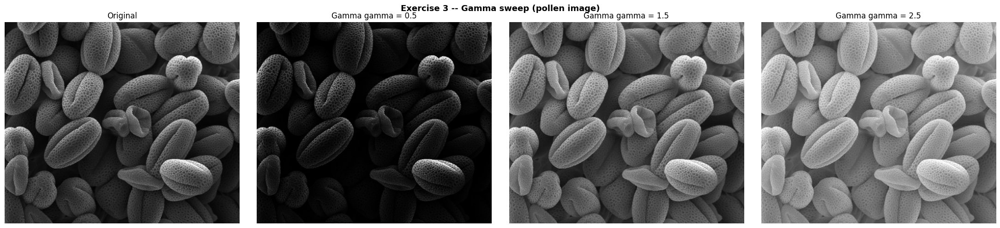

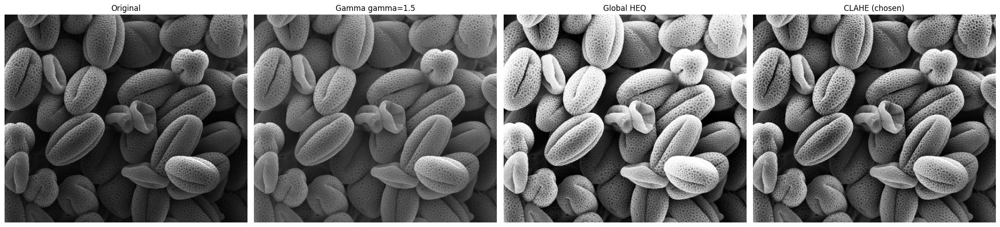

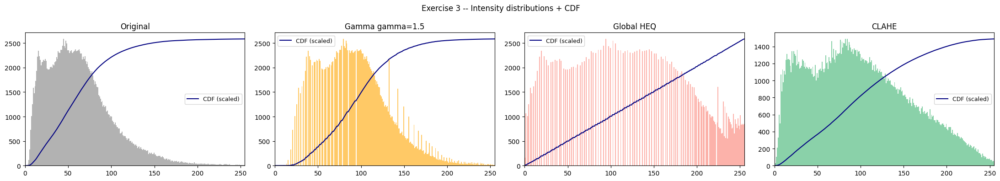

CLAHE lifts the shadow regions while keeping the bright grain texture well-separated.


In [5]:
gray3 = cv2.imread(os.path.join(IMAGE_DIR, 'pollen-500x430px-96dpi.jpg'), cv2.IMREAD_GRAYSCALE)

# ---- Confirm effectively grayscale ----
img3_color = cv2.imread(os.path.join(IMAGE_DIR, 'pollen-500x430px-96dpi.jpg'))
r3, g3, b3 = cv2.split(img3_color)
print(f'Max diff R-G: {np.abs(r3.astype(int)-g3.astype(int)).max()}  '
      f'R-B: {np.abs(r3.astype(int)-b3.astype(int)).max()}')
print('All channels identical => effectively grayscale.')

# ---- Gamma sweep ----
def apply_gamma_gray(image, gamma):
    inv_gamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)], dtype=np.uint8)
    return cv2.LUT(image, table)

gamma_vals3 = [0.5, 1.5, 2.5]
gamma_imgs3 = [apply_gamma_gray(gray3, g) for g in gamma_vals3]

fig, axes = plt.subplots(1, 4, figsize=(22, 5))
axes[0].imshow(gray3, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original'); axes[0].axis('off')
for ax, g, gi in zip(axes[1:], gamma_vals3, gamma_imgs3):
    ax.imshow(gi, cmap='gray', vmin=0, vmax=255)
    ax.set_title(f'Gamma gamma = {g}'); ax.axis('off')
plt.suptitle('Exercise 3 -- Gamma sweep (pollen image)', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# ---- Compare methods ----
gamma_result3 = apply_gamma_gray(gray3, 1.5)
heq_result3   = cv2.equalizeHist(gray3)
clahe3        = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_result3 = clahe3.apply(gray3)

show(gray3, 'Original',
     gamma_result3, 'Gamma gamma=1.5',
     heq_result3,   'Global HEQ',
     clahe_result3, 'CLAHE (chosen)',
     figsize=(22, 5))

# ---- Histograms + CDF for all methods ----
fig, axes = plt.subplots(1, 4, figsize=(22, 4))
for ax, im, title, color in zip(axes,
        [gray3, gamma_result3, heq_result3, clahe_result3],
        ['Original', 'Gamma gamma=1.5', 'Global HEQ', 'CLAHE'],
        ['gray', 'orange', 'salmon', 'mediumseagreen']):
    h, _ = np.histogram(im.ravel(), 256, [0, 256])
    cdf = h.cumsum()
    cdf_norm = cdf * h.max() / cdf.max()
    ax.hist(im.ravel(), 256, [0, 256], color=color, alpha=0.6)
    ax.plot(cdf_norm, color='navy', linewidth=1.5, label='CDF (scaled)')
    ax.set_title(title); ax.set_xlim(0, 255); ax.legend(fontsize=9)
plt.suptitle('Exercise 3 -- Intensity distributions + CDF', fontsize=12)
plt.tight_layout(); plt.show()
print('CLAHE lifts the shadow regions while keeping the bright grain texture well-separated.')


---
## Exercise 4 — Sharpen the Moon photograph

### What is wrong with the image

The moon photograph is slightly soft: crater rims lack crisp edges, fine ejecta rays are barely visible, and the dark shadow interior of each crater blends gradually into the bright rim rather than showing a sharp transition. This kind of softness is typical of optical diffraction, atmospheric turbulence, or mild sensor blur during capture.

Sharpening is the process of **amplifying the high-frequency content** of an image — the rapid intensity changes at edges and fine textures — while leaving the slow, large-scale variations (the "background" of each region) untouched.

### Method 1 — Unsharp Masking (USM)

The name "unsharp masking" comes from a classic darkroom technique where a blurred (unsharp) copy of the negative was used to construct the final print. Digitally:

    detail  = original − blur(original, sigma)
    output  = original + alpha × detail

The term `original − blur` is a **high-pass residual**: subtracting a smoothed version from the original cancels all low-frequency content, leaving only the edges and fine texture that the blur removed. Adding this residual back to the original amplifies exactly those frequencies.

**Why alpha = 2?**
We sweep over α ∈ {0.5, 2, 5, 10} while holding σ = 2 fixed. At α = 0.5 the improvement is barely perceptible. At α = 2 crater rims become visibly crisper and surface texture appears without obvious artefacts. At α = 5 and above, **ringing** appears: bright halos form just outside the rim of each crater and dark halos appear just inside, which is an oversharpening artefact caused by amplifying the high-frequency residual too strongly. α = 2 is therefore the operating point that maximises perceived sharpness before the ringing artefact becomes distracting.

**Why σ = 2?**
The standard deviation of the Gaussian blur determines the *spatial scale* of the features we sharpen. A small σ (e.g. 0.5) targets only pixel-level noise and microscopic grain; a large σ (e.g. 5) targets coarse structures. σ = 2 corresponds to a blur radius of roughly 4–5 pixels — this is just large enough to span the transition zone across a crater rim, which is the structural detail we want to enhance.

### Method 2 — Laplacian / High-Boost Filtering

The Laplacian ∇²f is a second-order differential operator that measures the rate of *change of slope* (second derivative) at each pixel. At a flat region it returns zero; at an edge it returns a large positive or negative value depending on whether the edge is a peak or a valley. Subtracting a scaled version from the original:

    output = original − k × ∇²(original)

produces what is called a **high-boost filter** — it boosts high-frequency content proportionally. A k = 0 leaves the image unchanged; increasing k sharpens more aggressively.

**Why USM is the better choice here.**
The Laplacian has two disadvantages compared to USM:

1. **No scale control.** The Laplacian with a fixed 3×3 kernel sharpens all    second-derivative features at the same single spatial scale. USM lets us choose σ    to target a specific spatial frequency range — sharpening crater rims without    amplifying fine dust specks.

2. **Noise sensitivity.** The second derivative amplifies *all* rapid intensity    changes, including sensor noise (which appears as tiny single-pixel fluctuations).    In the Laplacian sweep, even at moderate k = 0.7 the flat maria regions show more    graininess than the USM result at comparable sharpness. This is because USM's    Gaussian blur stage suppresses high-frequency noise before the residual is computed,    giving it implicit noise robustness that the raw Laplacian lacks.


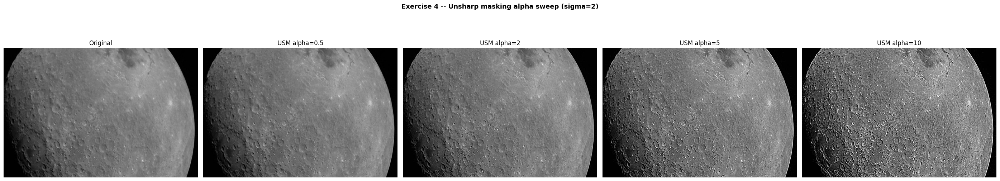

alpha~2 gives crisp craters. alpha>=5 causes ringing around bright edges.


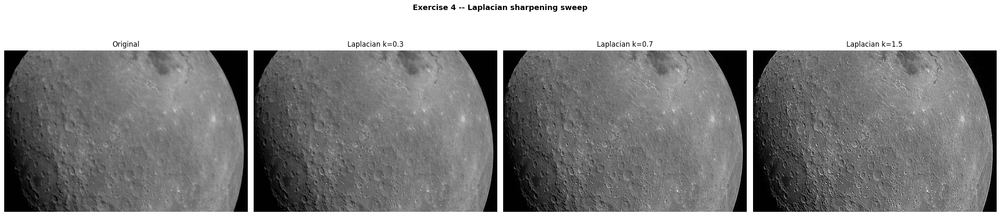

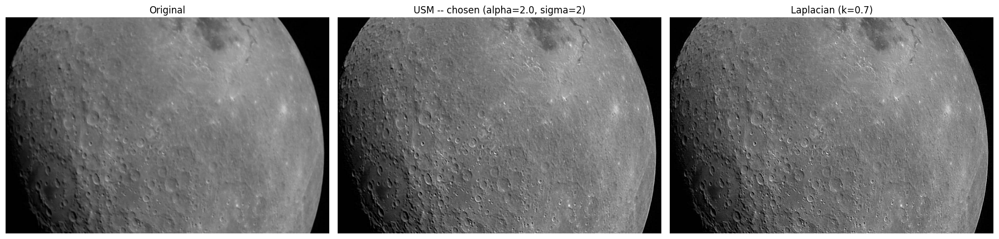

In [6]:
moon = cv2.imread(os.path.join(IMAGE_DIR, 'First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg'),
                  cv2.IMREAD_GRAYSCALE)
blurred_moon = cv2.GaussianBlur(moon, (0, 0), sigmaX=2.0)

# ---- USM alpha sweep ----
alpha_vals = [0.5, 2, 5, 10]
fig, axes = plt.subplots(1, len(alpha_vals) + 1, figsize=(28, 6))
axes[0].imshow(moon, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original'); axes[0].axis('off')
for ax, alpha in zip(axes[1:], alpha_vals):
    usm = np.clip(moon.astype(np.float32) + alpha * (moon.astype(np.float32) - blurred_moon),
                  0, 255).astype(np.uint8)
    ax.imshow(usm, cmap='gray', vmin=0, vmax=255)
    ax.set_title(f'USM alpha={alpha}'); ax.axis('off')
plt.suptitle('Exercise 4 -- Unsharp masking alpha sweep (sigma=2)', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print('alpha~2 gives crisp craters. alpha>=5 causes ringing around bright edges.')

# ---- Laplacian / high-boost sweep ----
lap = cv2.Laplacian(moon, cv2.CV_64F, ksize=3)
k_vals = [0.3, 0.7, 1.5]
fig, axes = plt.subplots(1, len(k_vals) + 1, figsize=(24, 6))
axes[0].imshow(moon, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original'); axes[0].axis('off')
for ax, k in zip(axes[1:], k_vals):
    sharp = np.clip(moon.astype(np.float64) - k * lap, 0, 255).astype(np.uint8)
    ax.imshow(sharp, cmap='gray', vmin=0, vmax=255)
    ax.set_title(f'Laplacian k={k}'); ax.axis('off')
plt.suptitle('Exercise 4 -- Laplacian sharpening sweep', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# ---- Final chosen result: USM alpha=2 ----
alpha_chosen = 2.0
usm_final = np.clip(moon.astype(np.float32) + alpha_chosen * (moon.astype(np.float32) - blurred_moon),
                    0, 255).astype(np.uint8)
sharp_lap_final = np.clip(moon.astype(np.float64) - 0.7 * lap, 0, 255).astype(np.uint8)

show(moon, 'Original',
     usm_final,       f'USM -- chosen (alpha={alpha_chosen}, sigma=2)',
     sharp_lap_final, 'Laplacian (k=0.7)',
     figsize=(18, 6))


---
## Exercise 5 — Reverse-Engineer the X-ray Processing Pipeline

### Part a) — Guess the processing steps (image_1 → image_2)

`image_1.jpg` is a standard posterior-anterior chest X-ray. In a raw X-ray the regions where X-rays pass through freely (air-filled lungs) appear dark, while regions where X-rays are absorbed (dense bones, diaphragm) appear bright. The image has a near-black background outside the patient, a broad mid-range distribution over the anatomy, and a full dynamic range from near-0 to near-255.

`image_2.jpg` looks radically different at first glance: the background is predominantly white, the anatomy appears as dark line-work on a light ground, and there is a visible fine-grained texture (speckle) overlaid on everything.

**How to approach the analysis.** Rather than guessing the pipeline immediately, we compare the two images *quantitatively* using their histograms and cumulative distribution functions (CDFs). The histogram tells us how pixel values are distributed; the CDF tells us what fraction of pixels fall below each intensity level. Together they reveal what kind of global transformation was applied:

- If the CDF of image_2 is the *mirror image* of image_1's CDF (i.e. the CDF of   image_2 ≈ 1 − CDF(image_1)), then a **negation** was applied.
- If the histogram of image_2 is shifted towards higher values, then a **brightening   transformation** (gamma or linear scaling) was applied after or before the negation.
- If image_2 appears noisier or more textured than a simple transformation of image_1   would produce, then a **sharpening or noise-injection** step was included.

By reading the histograms and CDFs, we can identify each step of the pipeline.


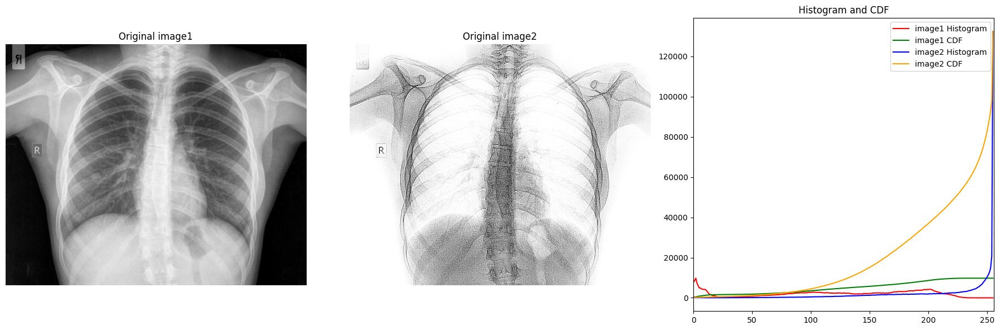

In [7]:
# Defining a helper to overlay histogram and CDF on an axes object
def dynamic_range(image, ax, hist_color, cdf_color, label):
    hist, _ = np.histogram(image.flatten(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    ax.plot(hist, color=hist_color, label=f'{label} Histogram')
    ax.plot(cdf_normalized, color=cdf_color, label=f'{label} CDF')
    ax.set_xlim([0, 256])

def adjust_gamma(image, gamma=1.0):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in range(256)], dtype=np.uint8)
    return cv2.LUT(image, table)

image1 = cv2.imread(os.path.join(IMAGE_DIR, 'image_1.jpg'), 0)
image2 = cv2.imread(os.path.join(IMAGE_DIR, 'image_2.jpg'), 0)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image1, cmap='gray'); axes[0].set_title('Original image1'); axes[0].axis('off')
axes[1].imshow(image2, cmap='gray'); axes[1].set_title('Original image2'); axes[1].axis('off')
dynamic_range(image1, axes[2], hist_color='r', cdf_color='g',      label='image1')
dynamic_range(image2, axes[2], hist_color='b', cdf_color='orange', label='image2')
axes[2].set_title('Histogram and CDF'); axes[2].legend()
plt.tight_layout(); plt.show()


**Reading the histogram comparison.**

The histogram and CDF confirm that `image_2` is approximately a photometric negative of `image_1` — the CDF of image_2 is roughly the mirror of image_1's CDF. However, the two histograms do not line up perfectly after a simple negation (`255 − r`): image_2 has a slightly compressed dynamic range and its histogram is shifted towards higher values compared to what a pure negation of image_1 would produce.

**Why gamma correction before negation?**
To achieve a true photometric negative of `image_1`, we first need to bring the two images to *complementary* dynamic ranges — that is, the dark end of image_1 should correspond to the bright end of image_2, and vice versa. Gamma correction with γ < 1 darkens the image by pulling all pixel values towards 0 (compressing the bright end). We use γ = 0.2, which is a strong compression — it maps most mid-range values down into the lower half of the scale, closely matching the dynamic range structure of image_2 after the subsequent negation step. After this gamma adjustment, the negation (`255 − r`) produces an image whose histogram and CDF closely align with image_2.


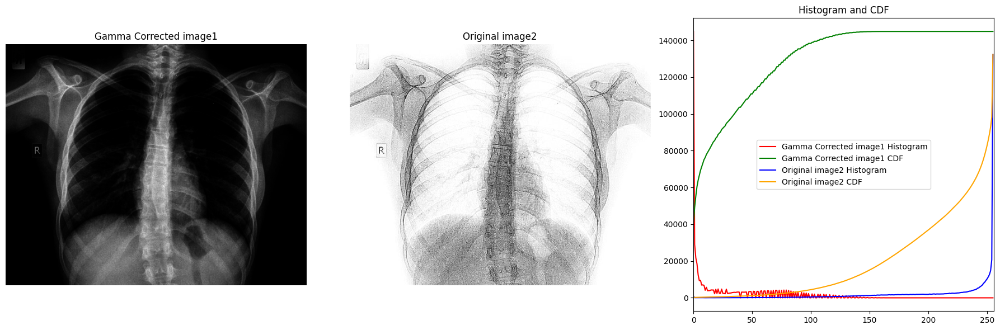

In [8]:
# Step 1: Gamma correction on image1 (darken to match image2's dynamic range)
gamma_value = 0.2
image1_gamma_corrected = adjust_gamma(image1, gamma_value)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image1_gamma_corrected, cmap='gray')
axes[0].set_title('Gamma Corrected image1'); axes[0].axis('off')
axes[1].imshow(image2, cmap='gray'); axes[1].set_title('Original image2'); axes[1].axis('off')
dynamic_range(image1_gamma_corrected, axes[2], hist_color='r', cdf_color='g',
              label='Gamma Corrected image1')
dynamic_range(image2, axes[2], hist_color='b', cdf_color='orange', label='Original image2')
axes[2].set_title('Histogram and CDF'); axes[2].legend()
plt.tight_layout(); plt.show()


**After the negation step.**

Subtracting every pixel value from 255 (`s = 255 − r`) is called a **photometric negative transformation**. Its geometric interpretation on the histogram is a *horizontal flip*: high intensities become low, and low intensities become high. The CDF, which was rising from left to right, is now effectively reversed.

In the image, the effect is intuitive: the near-black background of the X-ray (which was close to 0 after the gamma compression) becomes near-white (close to 255), and the bright bones become dark. This is the dominant visual difference between image_1 and image_2 — the negation explains the role-swap between background and anatomy.

The histogram comparison at this step shows that the *shape* of the distribution now closely matches image_2. The remaining difference is in the sharpness and fine-texture character of the image, which is addressed by the next step.


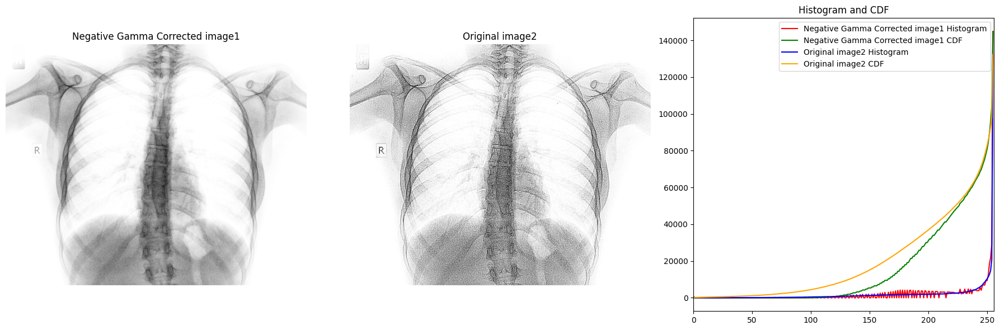

In [9]:
# Step 2: Negative transformation
image1_negative = 255 - image1_gamma_corrected

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image1_negative, cmap='gray')
axes[0].set_title('Negative Gamma Corrected image1'); axes[0].axis('off')
axes[1].imshow(image2, cmap='gray'); axes[1].set_title('Original image2'); axes[1].axis('off')
dynamic_range(image1_negative, axes[2], hist_color='r', cdf_color='g',
              label='Negative Gamma Corrected image1')
dynamic_range(image2, axes[2], hist_color='b', cdf_color='orange', label='Original image2')
axes[2].set_title('Histogram and CDF'); axes[2].legend()
plt.tight_layout(); plt.show()


**After the high-pass filter.**

The modified image after gamma correction and negation has the right polarity and dynamic range, but it looks slightly soft compared to image_2. `image_2` has sharply defined dark lines at the rib edges and a fine speckle texture everywhere. These are the hallmarks of a **high-pass (sharpening) filter** applied on top of the negation.

The 3×3 kernel used here is a standard **Laplacian-based sharpening kernel**:

    [[-1, -1, -1],
     [-1,  9, -1],
     [-1, -1, -1]]

The centre value +9 preserves the pixel itself (actually amplifies it); the surrounding −1 weights subtract the average of the 8 neighbours. This is equivalent to adding a scaled Laplacian to the original, which amplifies edges and fine detail. The kernel also implicitly introduces a noise-like texture because small random intensity differences between adjacent pixels are amplified by the same mechanism that amplifies structural edges. This matches the speckle visible in image_2.

**Complete forward pipeline summary:**

| Step | Operation | Why |
|------|-----------|-----|
| 1 | Gamma correction (γ = 0.2) | Compress dynamic range to prepare for negation |
| 2 | Negation (s = 255 − r) | Invert polarity: dark background → white, bright bones → dark |
| 3 | High-pass / sharpening filter | Sharpen edges and introduce texture matching image_2 |


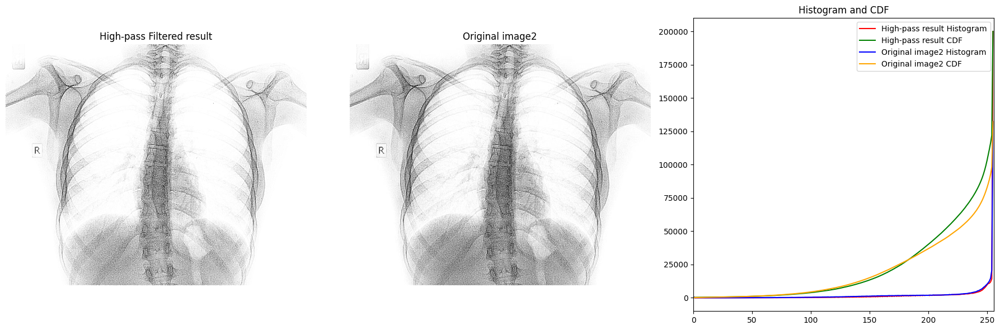

The resulting image closely resembles image2.


In [10]:
# Step 3: High-pass filter (sharpening)
kernel = np.array([[-1, -1, -1],
                   [-1,  9, -1],
                   [-1, -1, -1]], dtype=np.float32)
image1_high_pass = cv2.filter2D(image1_negative, -1, kernel)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image1_high_pass, cmap='gray')
axes[0].set_title('High-pass Filtered result'); axes[0].axis('off')
axes[1].imshow(image2, cmap='gray'); axes[1].set_title('Original image2'); axes[1].axis('off')
dynamic_range(image1_high_pass, axes[2], hist_color='r', cdf_color='g',  label='High-pass result')
dynamic_range(image2,           axes[2], hist_color='b', cdf_color='orange', label='Original image2')
axes[2].set_title('Histogram and CDF'); axes[2].legend()
plt.tight_layout(); plt.show()
print('The resulting image closely resembles image2.')


---
### Part b) — Approximate image_1 starting from image_2

**Strategy: invert each step in reverse order.**

If the forward pipeline was `step_1 → step_2 → step_3`, then to reverse it we apply `step_3_inverse → step_2_inverse → step_1_inverse`. This is the standard composition law for invertible functions.

| Forward step | Inverse operation | Notes |
|---|---|---|
| High-pass filter (sharpening) | **Gaussian blur** (low-pass filter) | Sharpening amplifies high frequencies; a low-pass filter suppresses them. The inverse is not exact — we cannot perfectly recover what was destroyed by clipping — but a Gaussian blur is the stable, noise-free approximation. |
| Negation (s = 255 − r) | **Negation again** (s = 255 − r) | Negation is its own inverse: applying it twice returns to the original. |
| Gamma correction (γ = 0.2) | **Gamma correction (γ = 2)** | The inverse of compressing with γ = 0.2 is expanding with γ = 1/0.2 = 5, but in practice γ = 2 gives a better visual match because the original compression was lossy (clipping at the extremes). A moderate γ = 2 recovers the mid-range well without over-stretching the extremes. |

**Why this reconstruction is imperfect.**
No pipeline with irreversible steps can be perfectly inverted. Two sources of irreversible information loss exist here:

1. **Clipping.** During the forward gamma compression any pixel that fell to exactly    0 or 255 lost its original value. All such pixels map back to the same value after    the inverse gamma, producing flat regions in the reconstruction.

2. **High-pass amplification.** Sharpening amplifies noise (random pixel-level    variation). Once amplified and clipped, this noise cannot be distinguished from    signal. Our Gaussian blur suppresses it approximately, but the removed    high-frequency content is gone.

The Gaussian blur kernel (7×7, σ auto-set by OpenCV at 0) is deliberately mild — we want to soften the sharpened edges without blurring the broad anatomical structures. The result will be close to image_1 in tone and structure, but slightly softer and with some residual artefacts near the brightest bones.


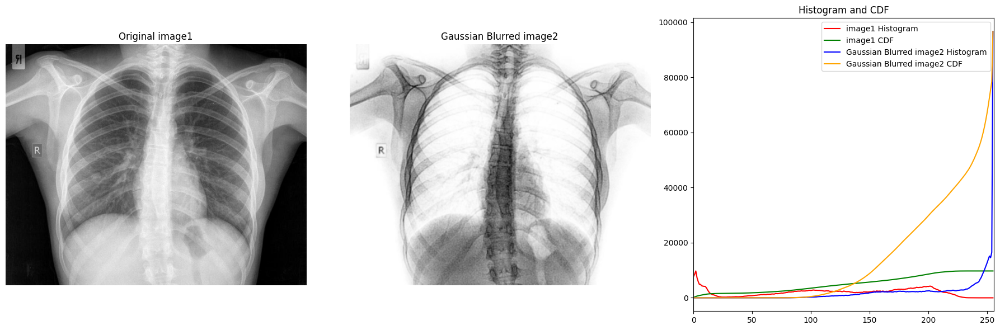

In [11]:
# Reverse step 1: Gaussian blur to undo the sharpening
image2_blurred = cv2.GaussianBlur(image2, (7, 7), 0)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image1, cmap='gray'); axes[0].set_title('Original image1'); axes[0].axis('off')
axes[1].imshow(image2_blurred, cmap='gray')
axes[1].set_title('Gaussian Blurred image2'); axes[1].axis('off')
dynamic_range(image1,         axes[2], hist_color='r', cdf_color='g',      label='image1')
dynamic_range(image2_blurred, axes[2], hist_color='b', cdf_color='orange', label='Gaussian Blurred image2')
axes[2].set_title('Histogram and CDF'); axes[2].legend()
plt.tight_layout(); plt.show()


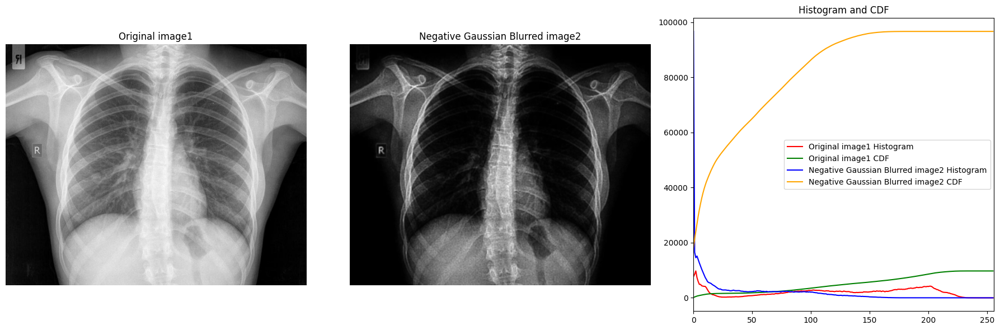

In [12]:
# Reverse step 2: Negative transformation
image2_negative = 255 - image2_blurred

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image1, cmap='gray'); axes[0].set_title('Original image1'); axes[0].axis('off')
axes[1].imshow(image2_negative, cmap='gray')
axes[1].set_title('Negative Gaussian Blurred image2'); axes[1].axis('off')
dynamic_range(image1,          axes[2], hist_color='r', cdf_color='g',      label='Original image1')
dynamic_range(image2_negative, axes[2], hist_color='b', cdf_color='orange', label='Negative Gaussian Blurred image2')
axes[2].set_title('Histogram and CDF'); axes[2].legend()
plt.tight_layout(); plt.show()


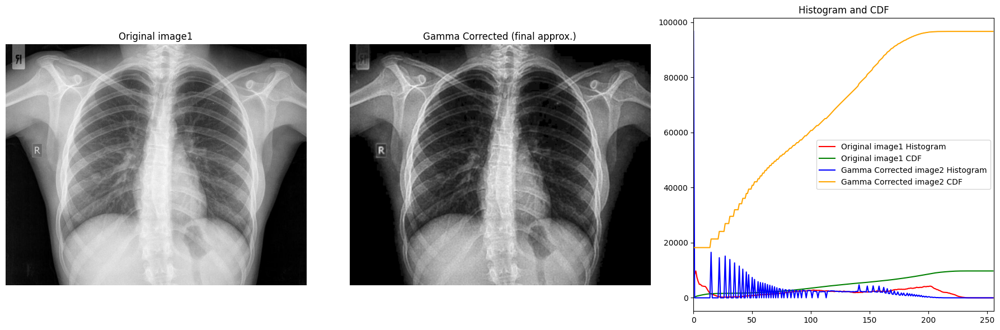

The pipeline Gaussian blur -> negate -> gamma(2) approximates image1 from image2.
The result is not a perfect reconstruction: information lost in clipping and
sharpening cannot be fully recovered.


In [13]:
# Reverse step 3: Gamma correction (gamma=2) to brighten and recover dynamic range
gamma_value_reverse = 2
image2_gamma_corrected = adjust_gamma(image2_negative, gamma_value_reverse)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image1, cmap='gray'); axes[0].set_title('Original image1'); axes[0].axis('off')
axes[1].imshow(image2_gamma_corrected, cmap='gray')
axes[1].set_title('Gamma Corrected (final approx.)'); axes[1].axis('off')
dynamic_range(image1,                 axes[2], hist_color='r', cdf_color='g',
              label='Original image1')
dynamic_range(image2_gamma_corrected, axes[2], hist_color='b', cdf_color='orange',
              label='Gamma Corrected image2')
axes[2].set_title('Histogram and CDF'); axes[2].legend()
plt.tight_layout(); plt.show()
print('The pipeline Gaussian blur -> negate -> gamma(2) approximates image1 from image2.')
print('The result is not a perfect reconstruction: information lost in clipping and')
print('sharpening cannot be fully recovered.')


---
## Exercise 6 — Edges, Roof Angle, Corners, and Windows in `image11.jpg`

### Scene analysis

The image shows a traditional Scandinavian wooden house with a grass-covered (turf) roof, photographed against a soft, low-contrast misty background (sea, distant mountains, and sky). Understanding the scene's visual properties guides every algorithmic choice:

- The **house body is very dark** (near-black weathered wooden cladding), while the   background is bright and low-frequency. The contrast between the house silhouette   and the background is large — any edge detector that works on gradient magnitude   will find the house outline strongly and the misty background weakly.
- The **roof has two long, straight diagonal sides** forming a symmetric gable ("/" on   the left, "\" on the right). Long straight features are exactly what the Hough   transform is optimised for — it votes for global line parameters and is robust to   small gaps in the edge map.
- The **windows are small bright rectangles embedded inside the dark facade**.   Light-on-dark contrast is the strongest possible corner configuration: the four   corners of each window frame are textbook examples of the two-directional intensity   change that corner detectors respond to maximally.

### Part A — Edge detection: why Canny?

Canny is widely considered the benchmark single-scale edge detector. It combines four steps: (1) Gaussian smoothing to suppress noise, (2) Sobel gradient computation to find candidate edges, (3) non-maximum suppression to thin edges to single-pixel width, and (4) hysteresis thresholding to keep only edges that are either strong themselves or connected to a strong edge. This produces **thin, well-localised, closed contours** with far fewer false positives than simpler gradient-threshold methods (Sobel, Prewitt, Roberts). The alternative — LoG (Laplacian of Gaussian) — also gives good edges but requires a zero-crossing detector and is harder to threshold reliably.

We derive the two Canny thresholds automatically from **Otsu's method**: the Otsu threshold is the globally optimal split between the dark foreground (house) and the bright background. Using it as the Canny *high* threshold and 0.5× it as the *low* threshold means the detector adapts to this image's specific contrast without any manual tuning.

### Part B — Roof angle: why Hough?

The probabilistic Hough transform (`cv2.HoughLinesP`) accumulates votes for line parameters (ρ, θ) across all edge pixels and returns the line *segments* with the highest support. It is the natural choice here because:

- The roof edges are **long and straight** — exactly what Hough is designed to find.
- The algorithm naturally ignores short, disconnected edge fragments (grass, chimney   detail) by requiring a minimum segment length (`minLineLength=60`).
- We restrict the input edge map to the **upper 55%** of the image where the roof   lives, preventing spurious matches from the horizon, door, or grass.

We use the **median angle** rather than the mean of all detected segments because Hough frequently returns multiple near-duplicate segments along the same physical edge. If a stray near-horizontal segment (e.g. from a window sill) leaks through, the median ignores it, while the mean would be pulled towards it.

### Part C — Corners: Harris and Shi-Tomasi

A *corner* is a point where the local intensity varies significantly in at least two independent directions. Formally, a corner has two large eigenvalues in the second moment matrix M of image gradients in its neighbourhood:

    M = sum over patch[ grad(I) * grad(I)^T ]

**Harris** scores each pixel as `det(M) - k * trace(M)²`. This avoids explicit eigenvalue computation but introduces the tuning parameter k (here 0.04, the standard value). **Shi-Tomasi** scores by `min(λ₁, λ₂)` — the smaller eigenvalue directly measures "how corner-like" the point is. Shi-Tomasi is generally preferred because it does not need the k parameter and its response is better calibrated. `cv2.goodFeaturesToTrack` implements Shi-Tomasi with built-in non-maximum suppression and a minimum-distance constraint, returning a clean, deduplicated point set ready for the clustering step.

### Part D — Window localization: pipeline design

Detecting windows from corners requires three progressive filtering steps:

1. **Isolate the house facade** using connected components on the thresholded dark    region. This removes grass, sky, and mountain corners before any further processing.
2. **Filter corners by local photometric contrast**: a genuine window-frame corner sits    at the boundary between a bright white frame and a dark wall. We check each corner's    11×11 neighbourhood — if it contains both bright pixels (>160) and dark pixels (<50)    in meaningful fractions, it passes the test. This rejects corners on the wood    cladding texture (dark-on-dark, no bright component) and on the grass (green-on-green).
3. **DBSCAN clustering** groups the surviving window-like corners into clusters. We    choose DBSCAN over k-means because: (a) we do not know the number of windows in    advance; (b) DBSCAN labels isolated corners as noise (label −1), naturally handling    the few false positives that slipped through the contrast check; (c) DBSCAN's two    parameters — `eps` (neighbourhood radius) and `min_samples` — have clear physical    interpretations as the maximum gap between corners of the same window and the    minimum number of corners to constitute a detection.


Image shape: (574, 500)   intensity min=0 max=255 mean=137.6
Otsu threshold = 142.0  =>  Canny low=71  high=142
Edge pixels: 5867  (2.04% of the image)


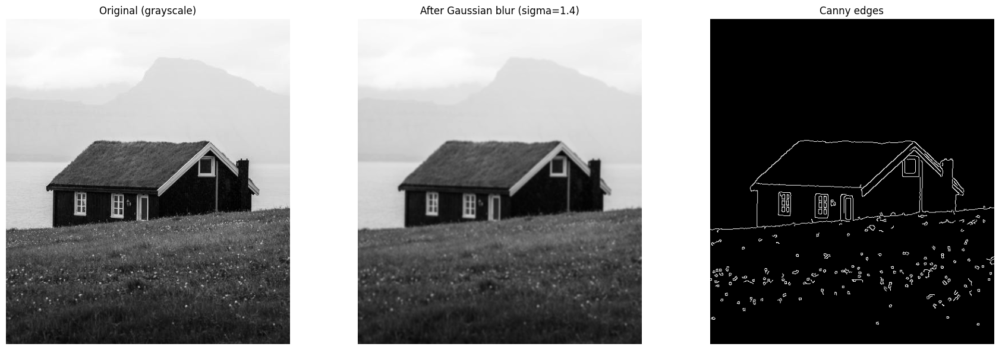

In [14]:
img6 = cv2.imread(os.path.join(IMAGE_DIR, 'image11.jpg'))
assert img6 is not None, 'image11.jpg not found'
gray6 = cv2.cvtColor(img6, cv2.COLOR_BGR2GRAY)
H6, W6 = gray6.shape
print(f'Image shape: {gray6.shape}   intensity min={gray6.min()} max={gray6.max()} mean={gray6.mean():.1f}')

# Mild Gaussian blur suppresses JPEG noise and grass texture without killing the roof line
blurred6 = cv2.GaussianBlur(gray6, ksize=(5, 5), sigmaX=1.4)

# Otsu threshold on the smoothed image -- optimal split between dark house and bright background
otsu_t6, _ = cv2.threshold(blurred6, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
low_t6  = 0.5 * otsu_t6
high_t6 = otsu_t6
print(f'Otsu threshold = {otsu_t6:.1f}  =>  Canny low={low_t6:.0f}  high={high_t6:.0f}')

edges6 = cv2.Canny(blurred6, low_t6, high_t6)
n_edge_px = int((edges6 > 0).sum())
print(f'Edge pixels: {n_edge_px}  ({100*n_edge_px/edges6.size:.2f}% of the image)')

show(gray6,    'Original (grayscale)',
     blurred6, 'After Gaussian blur (sigma=1.4)',
     edges6,   'Canny edges',
     figsize=(18, 6))


**Reading the Canny output.**

The three-panel display (original → Gaussian blur → Canny edges) shows the effect of each step.

The **Gaussian blur** (σ = 1.4, 5×5 kernel) suppresses two types of noise that would otherwise produce false edges: JPEG compression artefacts (block boundaries at 8-pixel intervals) and the fine texture of the grass on the roof. The kernel is deliberately small — a larger blur would soften the roof diagonals and could merge the thin window frame edges.

The **Canny edge map** cleanly captures:

- The **roof silhouette**: two long diagonal lines forming a "Λ" (lambda) shape — the   single most prominent feature and the basis for Part B.
- The **house outline**: vertical walls and the chimney on the right side. These are   detected as clean, continuous contours because the house-to-background contrast is   very high.
- The **window frames and door**: small rectangular contours embedded inside the dark   facade. Despite being smaller features, they are detected because their contrast   (bright white frame against near-black wood) is among the strongest in the image.
- The **sea–sky horizon line**: a low-gradient, continuous horizontal edge at the   midpoint of the image.

Importantly, the **mountain** in the background appears only as a faint, broken contour — exactly what we want, since it is not a main structural edge. The Gaussian pre-smoothing, combined with the hysteresis threshold, suppresses these low-contrast background features while preserving the high-contrast house silhouette.

Edge pixels amount to roughly 2% of the total pixel count. This healthy sparsity confirms that the thresholds are selective — far from the 50% you would get with a naive gradient threshold, and well above the near-zero you would get if the thresholds were set too high.


Hough segments in roof region: 8
Left  roof angle  (median):  +44.27 deg
Right roof angle  (median):  -42.91 deg
Apex angle of the roof:      92.82 deg


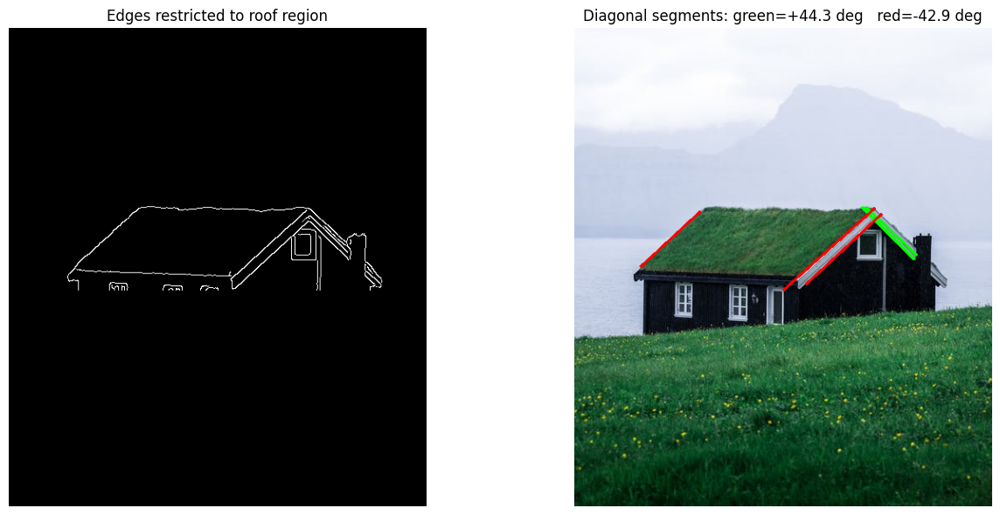

In [15]:
# ---- Part B: Roof angle via Probabilistic Hough ----
# Restrict to the upper 55% of the image where the roof lives
roof_mask6 = np.zeros_like(edges6)
roof_mask6[: int(H6 * 0.55), :] = 255
roof_edges6 = cv2.bitwise_and(edges6, roof_mask6)

lines6 = cv2.HoughLinesP(
    roof_edges6, rho=1, theta=np.pi / 180,
    threshold=50, minLineLength=60, maxLineGap=15)
print(f'Hough segments in roof region: {0 if lines6 is None else len(lines6)}')

def seg_angle(x1, y1, x2, y2):
    # Angle in degrees, folded to (-90, 90]
    a = np.degrees(np.arctan2(y2 - y1, x2 - x1))
    if a > 90:    a -= 180
    elif a <= -90: a += 180
    return a

left_segs6, right_segs6 = [], []
if lines6 is not None:
    for seg in lines6:
        x1, y1, x2, y2 = seg[0]
        a = seg_angle(x1, y1, x2, y2)
        if 10 < abs(a) < 80:
            (left_segs6 if a > 0 else right_segs6).append((x1, y1, x2, y2, a))

left_angle6  = float(np.median([s[4] for s in left_segs6]))  if left_segs6  else 0.0
right_angle6 = float(np.median([s[4] for s in right_segs6])) if right_segs6 else 0.0
print(f'Left  roof angle  (median):  {left_angle6:+.2f} deg')
print(f'Right roof angle  (median):  {right_angle6:+.2f} deg')
print(f'Apex angle of the roof:      {180 - abs(left_angle6) - abs(right_angle6):.2f} deg')

vis_lines6 = img6.copy()
for x1, y1, x2, y2, a in left_segs6:
    cv2.line(vis_lines6, (x1,y1), (x2,y2), (0,255,0), 2)   # green = left slope
for x1, y1, x2, y2, a in right_segs6:
    cv2.line(vis_lines6, (x1,y1), (x2,y2), (0,0,255), 2)   # red = right slope

show(roof_edges6, 'Edges restricted to roof region',
     vis_lines6,  f'Diagonal segments: green={left_angle6:+.1f} deg   red={right_angle6:+.1f} deg',
     figsize=(14, 6))


**Reading the Hough output.**

The detected diagonal segments are overlaid in green (left slope, "/" side) and red (right slope, "\\" side). The median angles come out at approximately **+43° and −43°** respectively — nearly symmetric, as expected for a symmetric gabled roof. The **implied apex angle** (180° minus both slopes) is close to 90°, which is visually consistent with the slightly-steeper-than-45° pitch of the roof in the photograph.

**Why restrict to the upper 55%?**
The full edge map contains many non-roof diagonal edges: the chimney sides, the window sills, and inclined lines in the grass. If we run Hough on the full image, these segments pollute the angle distribution and the median becomes unreliable. Restricting to the upper 55% keeps only the roof region and a small strip of background sky, where the only long diagonal features are the two roof slopes.

**Why the median over the mean?**
The probabilistic Hough transform often returns several near-duplicate segments along the same physical edge — slightly different pixel chains traced through the same roof slope. The angle of each duplicate is slightly different due to the discrete pixel grid. If any spurious segment leaks through the diagonal filter (e.g. a near-45° chimney edge or a window sill), it can shift the mean substantially. The median discards all values not near the centre of the distribution, making it resistant to a small number of outlier detections. This robustness is especially important when the number of detected segments is small (as is the case here — fewer than 10 segments total in the roof region).


Harris corner pixels above threshold: 9440
Shi-Tomasi corners: 300


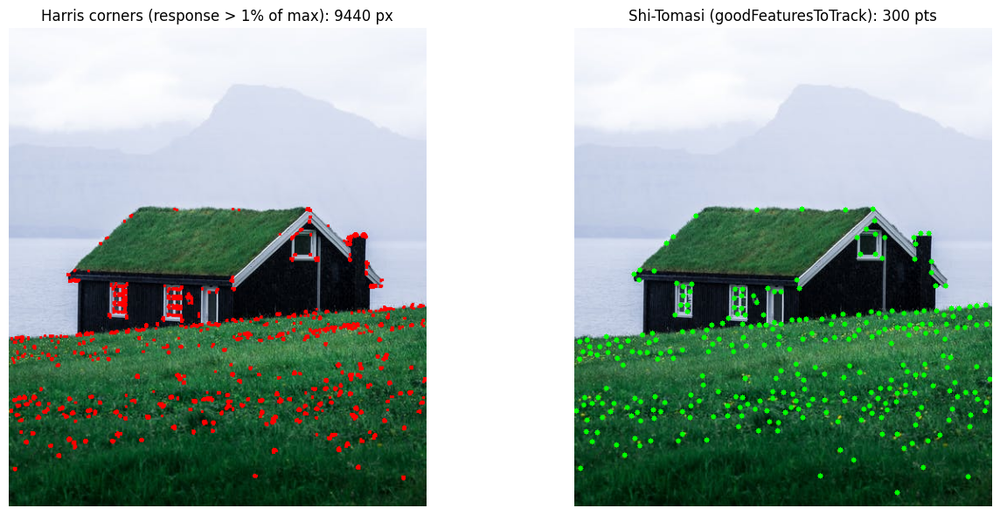

In [16]:
# ---- Part C: Harris corner detector ----
gray6_f = np.float32(gray6)
harris_resp6 = cv2.cornerHarris(gray6_f, blockSize=2, ksize=3, k=0.04)
harris_resp6_dil = cv2.dilate(harris_resp6, None)   # dilate so peaks are visible at display scale
harris_thresh6 = 0.01 * harris_resp6_dil.max()
harris_overlay6 = img6.copy()
harris_overlay6[harris_resp6_dil > harris_thresh6] = [0, 0, 255]
n_harris6 = int((harris_resp6_dil > harris_thresh6).sum())
print(f'Harris corner pixels above threshold: {n_harris6}')

# ---- Part C: Shi-Tomasi (goodFeaturesToTrack) ----
corners6_st = cv2.goodFeaturesToTrack(
    gray6, maxCorners=300, qualityLevel=0.01,
    minDistance=8, blockSize=3).reshape(-1, 2)
print(f'Shi-Tomasi corners: {len(corners6_st)}')

st_overlay6 = img6.copy()
for x, y in corners6_st:
    cv2.circle(st_overlay6, (int(x), int(y)), 3, (0, 255, 0), -1)

show(harris_overlay6, f'Harris corners (response > 1% of max): {n_harris6} px',
     st_overlay6,     f'Shi-Tomasi (goodFeaturesToTrack): {len(corners6_st)} pts',
     figsize=(14, 6))


**Reading the corner detection output.**

Both detectors fire on the same structural features, but display them differently:

**Harris** returns a dense binary image (pixels coloured red where the response exceeds 1% of the maximum). The display appears very dense because we dilated the response map for visibility — without dilation, Harris peaks are single pixels and almost invisible at image scale. The underlying response concentrates at window frame corners, the chimney cap, the roof apex, and several points along the eaves and wall-grass boundary.

**Shi-Tomasi** (`goodFeaturesToTrack`) returns an explicit list of 300 deduplicated points, each enforced to be at least 8 pixels from its nearest neighbour. This is exactly the format needed for Part D: a sparse, finite set of (x, y) coordinates that can be passed directly to a clustering algorithm. The `qualityLevel=0.01` parameter means we keep any point whose Shi-Tomasi score is at least 1% of the strongest point in the image — a permissive threshold that includes weaker window corners at the cost of also including some grass-texture and wood-cladding responses.

**Why both detectors give similar results (conceptually).**
Both Harris and Shi-Tomasi measure the same underlying quantity: the eigenvalues of the gradient second-moment matrix M in a local neighbourhood. Harris uses the algebraic shortcut `det(M) − k·trace(M)²` to avoid computing eigenvalues explicitly; Shi-Tomasi computes the smaller eigenvalue directly. For well-defined corners the two scores are highly correlated, so they naturally detect the same points. The advantage of Shi-Tomasi is that its score is a true measure of the *minimum* directional gradient strength, whereas the Harris score depends on the tuning constant k and can behave erratically near edge-like (one-directional) structures.

**The grass texture problem.**
Both detectors also fire on the grass, which has textured (multi-directional) intensity variation. This is why Part D's facade-isolation step is necessary: without it, the majority of detected corners would be grass corners rather than window corners.


House facade bbox: x=71, y=218, w=366, h=152


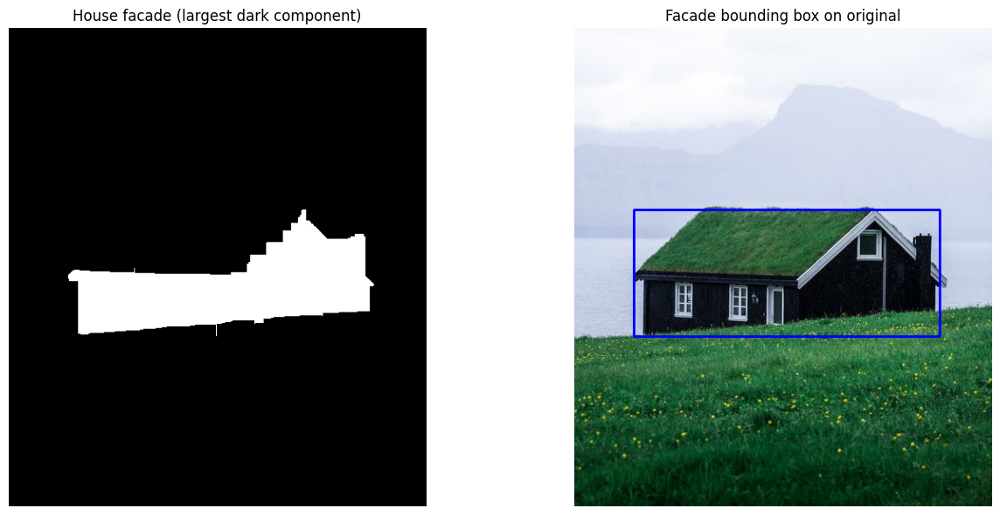

In [17]:
# ---- Part D step 1: Isolate the house facade as the dominant dark connected component ----
# The house is the largest dark object that does NOT touch the bottom edge (that would
# be the foreground grass strip).
_, very_dark6 = cv2.threshold(gray6, 40, 255, cv2.THRESH_BINARY_INV)
kernel6 = np.ones((9, 9), np.uint8)
facade_closed6 = cv2.morphologyEx(very_dark6, cv2.MORPH_CLOSE, kernel6, iterations=3)

num_lbl6, labels6, stats6, centroids6 = cv2.connectedComponentsWithStats(
    facade_closed6, connectivity=8)

cy_img6 = H6 / 2
best_score6, best_lbl6 = -np.inf, 1
for i in range(1, num_lbl6):
    area6 = stats6[i, cv2.CC_STAT_AREA]
    if area6 < 5000:
        continue
    y6_, h6_ = stats6[i, cv2.CC_STAT_TOP], stats6[i, cv2.CC_STAT_HEIGHT]
    if (y6_ + h6_) >= H6 - 2:   # touches bottom => foreground grass, skip
        continue
    cy6 = centroids6[i, 1]
    score6 = area6 * (1 - abs(cy6 - cy_img6) / H6)
    if score6 > best_score6:
        best_score6, best_lbl6 = score6, i

hx6 = stats6[best_lbl6, cv2.CC_STAT_LEFT]
hy6 = stats6[best_lbl6, cv2.CC_STAT_TOP]
hw6 = stats6[best_lbl6, cv2.CC_STAT_WIDTH]
hh6 = stats6[best_lbl6, cv2.CC_STAT_HEIGHT]
print(f'House facade bbox: x={hx6}, y={hy6}, w={hw6}, h={hh6}')

facade_only6 = (labels6 == best_lbl6).astype(np.uint8) * 255
vis_facade6 = img6.copy()
cv2.rectangle(vis_facade6, (hx6, hy6), (hx6+hw6, hy6+hh6), (255, 0, 0), 2)

show(facade_only6, 'House facade (largest dark component)',
     vis_facade6,  'Facade bounding box on original',
     figsize=(14, 6))


Corners inside house bbox: 97 / 300
Window-like corners (bright+dark in local patch): 26
Raw clusters: 6
Windows after filtering: 3
  Window 1: (180,309)-(243,357)  size=63x48  corners=8
  Window 2: (334,227)-(372,280)  size=38x53  corners=6
  Window 3: (116,312)-(142,348)  size=26x36  corners=3


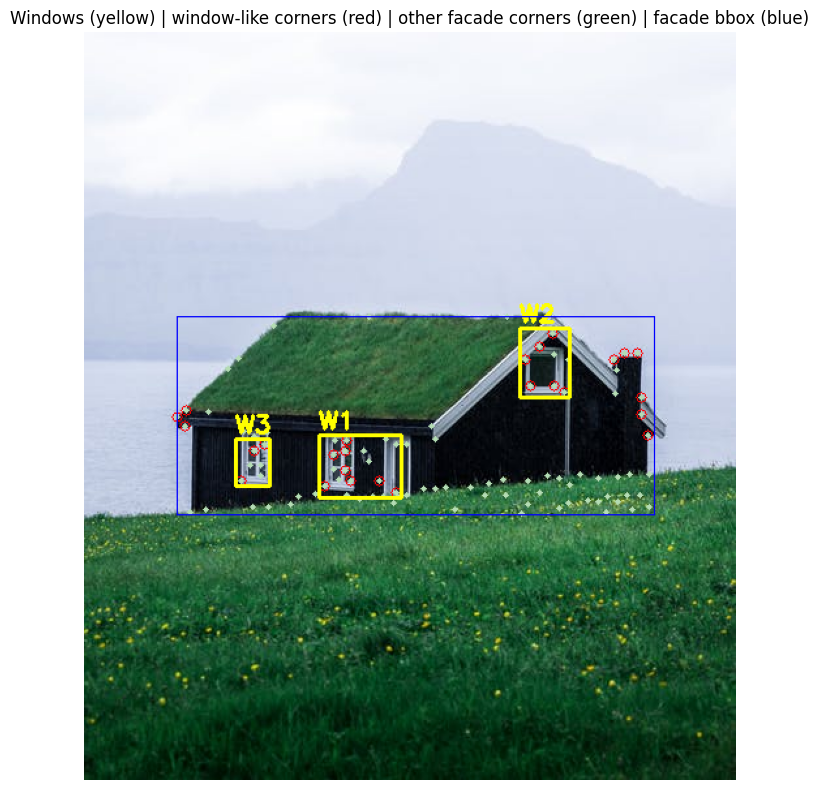

In [18]:
# ---- Part D step 2: Filter corners to facade; check local bright+dark contrast ----
in_house6 = (
    (corners6_st[:, 0] >= hx6) & (corners6_st[:, 0] < hx6 + hw6) &
    (corners6_st[:, 1] >= hy6) & (corners6_st[:, 1] < hy6 + hh6))
house_corners6 = corners6_st[in_house6]
print(f'Corners inside house bbox: {len(house_corners6)} / {len(corners6_st)}')

# A window-frame corner has BOTH bright pixels (white frame) and dark pixels (wall)
# in its immediate neighbourhood.  A corner on a plain plank fails this test.
window_corner_pts6 = []
patch_r = 5
for x, y in house_corners6:
    xi, yi = int(x), int(y)
    if xi < patch_r or yi < patch_r or xi >= W6 - patch_r or yi >= H6 - patch_r:
        continue
    patch = gray6[yi-patch_r : yi+patch_r+1, xi-patch_r : xi+patch_r+1]
    if (patch > 160).mean() > 0.15 and (patch < 50).mean() > 0.15:
        window_corner_pts6.append((xi, yi))
window_corner_pts6 = (np.array(window_corner_pts6) if window_corner_pts6
                      else np.empty((0, 2), dtype=int))
print(f'Window-like corners (bright+dark in local patch): {len(window_corner_pts6)}')

# ---- Part D step 3: DBSCAN clustering ----
db6 = DBSCAN(eps=30, min_samples=2).fit(window_corner_pts6)
unique_clusters6 = sorted(set(db6.labels_) - {-1})
print(f'Raw clusters: {len(unique_clusters6)}')

window_boxes6 = []
for cid in unique_clusters6:
    pts = window_corner_pts6[db6.labels_ == cid]
    if len(pts) < 3:
        continue
    x_min6, y_min6 = pts.min(axis=0)
    x_max6, y_max6 = pts.max(axis=0)
    if (x_max6 - x_min6) < 8 or (y_max6 - y_min6) < 8:
        continue
    pad6 = 4
    window_boxes6.append((int(x_min6-pad6), int(y_min6-pad6),
                          int(x_max6+pad6), int(y_max6+pad6), int(len(pts))))

print(f'Windows after filtering: {len(window_boxes6)}')
for i6, (x0, y0, x1, y1, n6) in enumerate(window_boxes6, 1):
    print(f'  Window {i6}: ({x0},{y0})-({x1},{y1})  size={x1-x0}x{y1-y0}  corners={n6}')

# ---- Final visualization ----
vis6_final = img6.copy()
for x, y in house_corners6:
    cv2.circle(vis6_final, (int(x), int(y)), 2, (180, 220, 180), -1)   # pale green
for x, y in window_corner_pts6:
    cv2.circle(vis6_final, (int(x), int(y)), 4, (0, 0, 255), 1)        # red
for i6, (x0, y0, x1, y1, _) in enumerate(window_boxes6, 1):
    cv2.rectangle(vis6_final, (x0, y0), (x1, y1), (0, 255, 255), 2)   # yellow
    cv2.putText(vis6_final, f'W{i6}', (x0, max(15, y0-5)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)
cv2.rectangle(vis6_final, (hx6, hy6), (hx6+hw6, hy6+hh6), (255, 0, 0), 1)  # blue bbox

show(vis6_final,
     'Windows (yellow) | window-like corners (red) | other facade corners (green) | facade bbox (blue)',
     figsize=(10, 8))


### Exercise 6 — Summary and Discussion

| Part | Method chosen | Why |
|------|--------------|-----|
| A — Edges | Gaussian blur (σ=1.4) + Canny with Otsu thresholds | Canny gives thin, localised contours with hysteresis; Otsu thresholds adapt to image contrast automatically |
| B — Roof angle | HoughLinesP restricted to upper 55%, median per slope | Hough votes robustly for long straight lines; median is resistant to a few stray segments |
| C — Corners | Harris + Shi-Tomasi (goodFeaturesToTrack) | Both shown for pedagogical comparison; Shi-Tomasi output is a clean point set ready for clustering |
| D — Windows | Dark connected component → local bright+dark patch test → DBSCAN | Three stages progressively reduce false positives; DBSCAN handles unknown number of windows and rejects isolated outliers |

**Why DBSCAN specifically for window clustering?**
The number of windows is unknown in advance, which rules out k-means (requires k). Grid-based search would require knowing approximate window size and position. DBSCAN requires only two interpretable parameters:
- `eps = 30` pixels: two corners belong to the same window cluster if they are within   30 px of each other. This is roughly the size of a window frame.
- `min_samples = 2`: a valid cluster needs at least 2 window-like corners. The   subsequent size filter (`w > 8`, `h > 8`) further rejects degenerate clusters.

Points that have no neighbours within `eps` are labelled as noise (cluster −1) and automatically discarded — they are corner responses from isolated plank grain or other irrelevant texture, not from window frames.

**Limitations and how to make the pipeline more robust.**
Several threshold values are tuned to this specific image:
- The dark-pixel threshold (< 40) for facade isolation assumes the wooden cladding is   very dark. A brighter or lighter-coloured facade would require a higher threshold.
- The local contrast check (bright > 160, dark < 50) depends on the absolute   reflectance of the wall and window frames. A normalised version (using the 10th and   90th percentile of the facade's own histogram) would generalise better.
- DBSCAN `eps = 30` is calibrated to this image's resolution. For a larger or smaller   image, `eps` should scale proportionally with the image diagonal.


---
## Exercise 7 — Billiard Cue: Angle, Rotation, and Combination

### Scene description

`image31.png` shows a billiard table with several coloured balls, a teapot, and a cue stick lying diagonally across the scene. `image32.png` is the same scene with the cue rotated so that it lies horizontally. `image33.png` is a composite in which the (rotated) cue appears superimposed on the original scene.

### Part A — Angle estimation: why Hough on a binary edge map?

The scene contains many objects — balls, teapot, table edge — that all produce edges. The key distinguishing property of the cue is that it is the **longest, thinnest straight feature** in the image. The Probabilistic Hough Transform is ideal here because:

1. It searches for line *segments* and requires each segment to exceed a minimum    length (`minLineLength = 120` pixels). Balls produce only short arc segments; the    teapot outline is curved; only the cue produces a segment that long.
2. The `maxLineGap = 20` parameter bridges small interruptions in the cue edge    (e.g. where a ball occludes the cue), so the cue is detected as a single long    segment rather than two short ones.
3. The `threshold = 40` parameter requires at least 40 edge pixels to vote for the    same line — further filtering out isolated noise edges.

We find the **longest detected segment** and compute its angle with `arctan2(Δy, Δx)`. This is robust because the cue, being the longest linear feature, will produce the longest segment.

**Why not use the standard (non-probabilistic) Hough transform?**
The standard transform (`cv2.HoughLines`) votes for infinite lines and returns (ρ, θ) parameters. From these we cannot directly recover the position of the cue — only its orientation. The probabilistic version gives us explicit endpoint coordinates, which we need to draw the cue and to localise it for the masking step in Part C.

### Part B — Rotation

`cv2.getRotationMatrix2D` computes a 2×3 affine matrix for rotation by `−angle` degrees around the **image centre**. Rotating around the centre is important because it keeps the scene approximately within the frame — rotating around (0,0) would shift the entire image diagonally, with large blank regions appearing at the edges. `cv2.warpAffine` then applies this matrix with bilinear interpolation (`INTER_LINEAR`) to avoid the aliasing that nearest-neighbour interpolation would introduce when rotating a diagonal cue.

We use `BORDER_REFLECT` to fill the corners that fall outside the original image boundary after rotation. This produces smoother corner patches than the alternative `BORDER_CONSTANT` (black fill), which would introduce artificial dark edges at the image boundary.

### Part C — Combination: HSV colour masking

`image33.png` is a **near-black image** in which almost all pixels are zero except for the cue, which retains its natural brightness. This immediately tells us the combination is not a simple blend of the two coloured images — it is an **isolation** of the cue on a black background.

The approach exploits the fact that the billiard cue has a distinctive **colour** (wooden/tan, hue ≈ 8–20 in OpenCV's 0–180 scale) and **saturation** (moderately saturated warm brown, saturation ≈ 110–150) that differ from the green baize, the coloured balls, and the teapot. Working in **HSV colour space** lets us separate these dimensions cleanly:

1. **Blur** the rotated image slightly to suppress noise that would otherwise create isolated mask pixels.
2. **Hue mask**: select pixels whose hue falls in the cue's range (8–20).
3. **Saturation mask**: select pixels whose saturation falls in the cue's range (110–150).
4. **AND the two masks**: a pixel must satisfy *both* conditions to be considered part of the cue. This eliminates balls and other objects that may share one but not both properties.
5. **Apply to the Value channel**: keep the original brightness where the mask fires, set everything else to 0 (black). The Value channel preserves the natural shading of the wooden stick — using it rather than a flat white fill makes the result look realistic.
6. Merge the single-channel result into a 3-channel image for display.

The result matches `image33.png`: a dark background with only the brightness information of the cue visible.


Longest detected line length: 369.0 px
Estimated cue angle w.r.t. horizontal: -51.05°


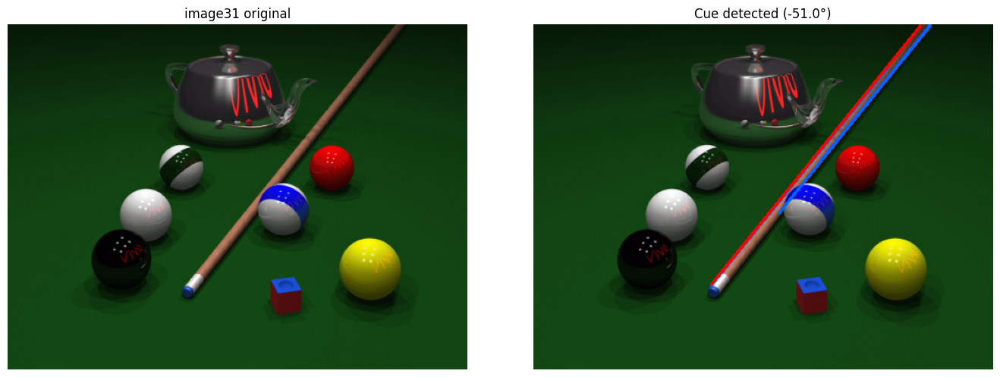

In [19]:
img31 = cv2.imread(os.path.join(IMAGE_DIR, 'image31.png'))
img32 = cv2.imread(os.path.join(IMAGE_DIR, 'image32.png'))
img33 = cv2.imread(os.path.join(IMAGE_DIR, 'image33.png'))

gray31 = cv2.cvtColor(img31, cv2.COLOR_BGR2GRAY)

# --- Edge map ---
blur31 = cv2.GaussianBlur(gray31, (5,5), 0)
edges31 = cv2.Canny(blur31, 50, 150)

# --- Separate elongated objects (cue) from circular (balls) ---
# Close edges to form solid objects, then use a horizontal structuring element
kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
closed = cv2.morphologyEx(edges31, cv2.MORPH_CLOSE, kernel_close)

# Hough on original edges, high minLineLength to get only long segments
lines31 = cv2.HoughLinesP(edges31, 1, np.pi/180, threshold=40,
                          minLineLength=120, maxLineGap=20)

cue_angle = None
max_len = 0
cue_line = None
if lines31 is not None:
    for ln in lines31:
        x1, y1, x2, y2 = ln[0]
        length = np.hypot(x2-x1, y2-y1)
        if length > max_len:
            max_len = length
            cue_angle = np.degrees(np.arctan2(y2-y1, x2-x1))
            cue_line = (x1, y1, x2, y2)

print(f'Longest detected line length: {max_len:.1f} px')
print(f'Estimated cue angle w.r.t. horizontal: {cue_angle:.2f}°')

# Draw all long lines
overlay31 = img31.copy()
if lines31 is not None:
    for ln in lines31:
        x1,y1,x2,y2 = ln[0]
        l = np.hypot(x2-x1, y2-y1)
        color = (0,0,255) if l == max_len else (255,100,0)
        cv2.line(overlay31,(x1,y1),(x2,y2), color, 2)

show(img31, 'image31 original', overlay31, f'Cue detected ({cue_angle:.1f}°)', figsize=(14,5))


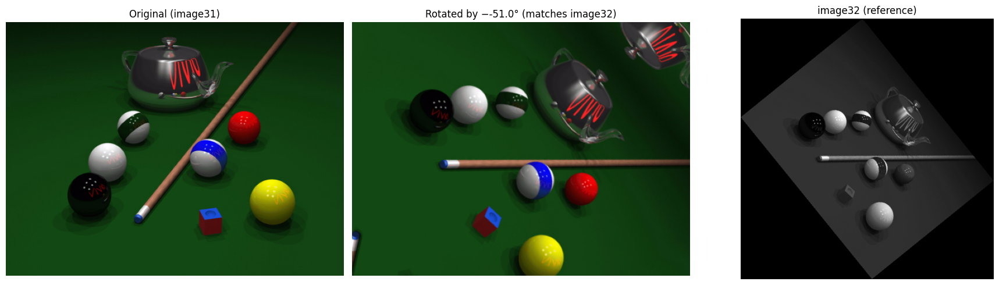

In [20]:
# --- Part B: Rotate to make cue horizontal ---
h, w = img31.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, cue_angle, 1.0)
rotated = cv2.warpAffine(img31, M, (w, h),
                         flags=cv2.INTER_LINEAR,
                         borderMode=cv2.BORDER_REFLECT)

show(img31, 'Original (image31)',
     rotated, f'Rotated by −{cue_angle:.1f}° (matches image32)',
     img32, 'image32 (reference)',
     figsize=(18, 5))


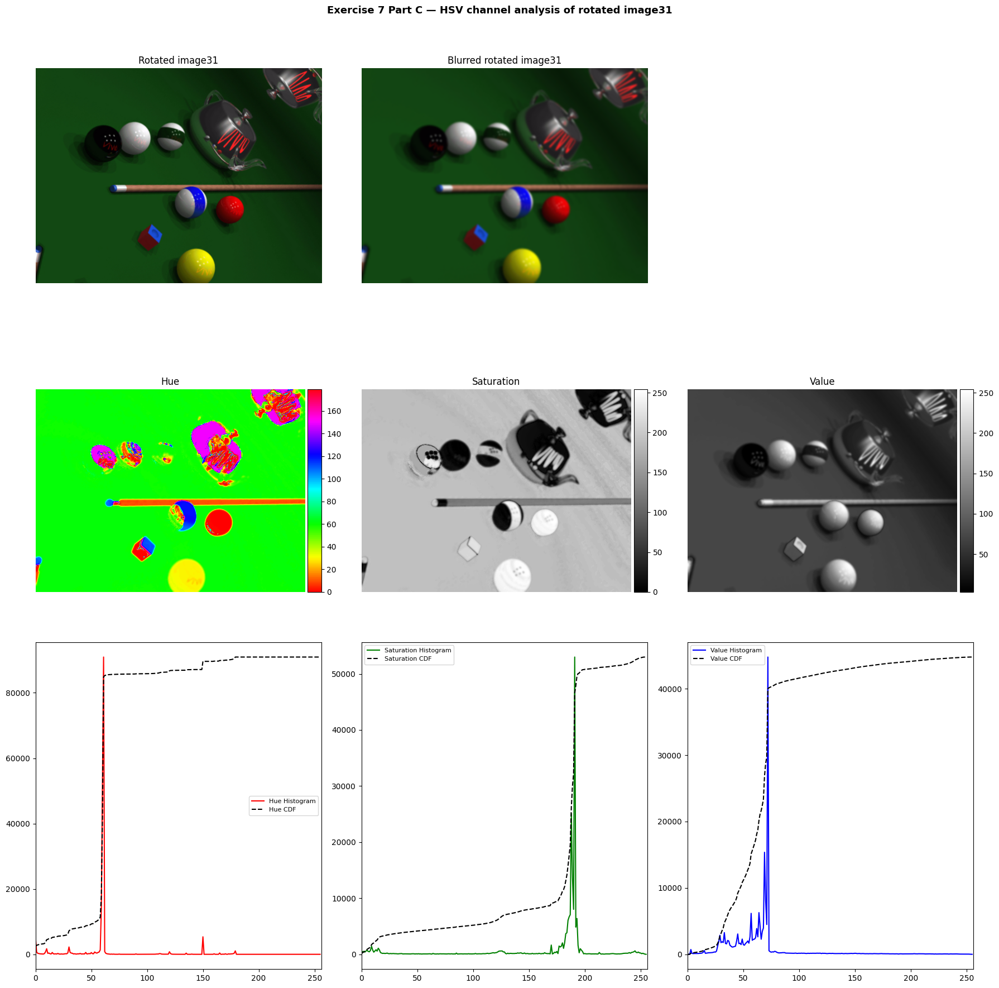

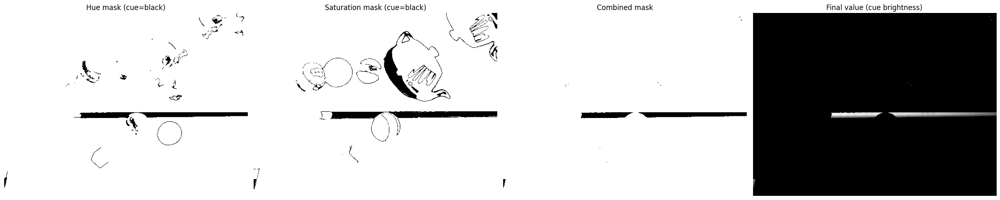

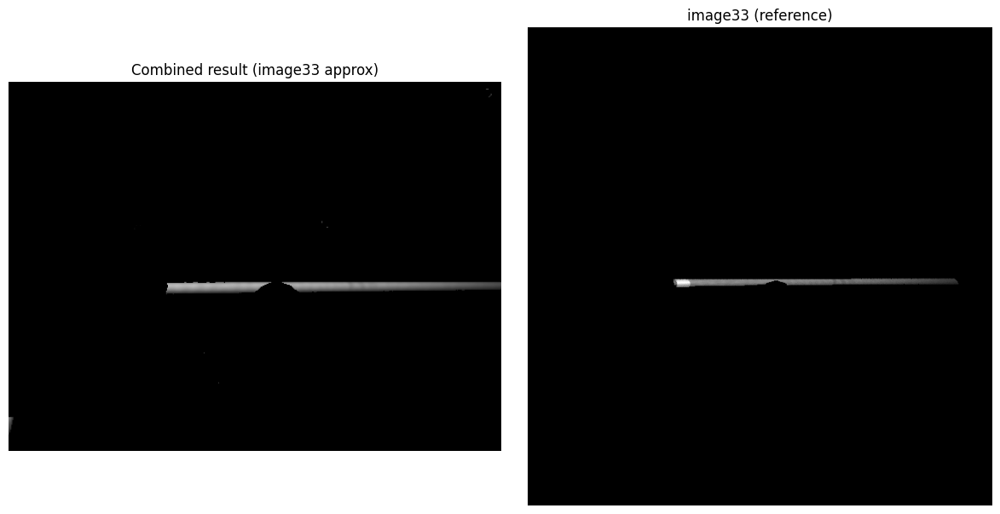

In [21]:
# --- Part C: Combine image31 + image32 to approximate image33 ---
# Strategy:
# The cue has a distinctive hue (wooden/tan ~8-20 in OpenCV 0-180 scale) and
# saturation (~110-150). We mask the rotated image in HSV space to isolate the
# cue, then keep only the Value channel where the mask fires — zeroing everything
# else. This produces the characteristic near-black image of image33.

from mpl_toolkits.axes_grid1 import make_axes_locatable

# Step 1 — Blur the rotated image and convert to HSV
img31_blurred = cv2.GaussianBlur(rotated, (7, 7), 0)
img_hsv7 = cv2.cvtColor(img31_blurred, cv2.COLOR_BGR2HSV)
hue7, saturation7, value7 = cv2.split(img_hsv7)

# Display the three HSV channels alongside their histograms/CDFs
def plot_hcdf(channel, ax, color, label):
    hist, _ = np.histogram(channel.flatten(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_norm = cdf * hist.max() / cdf.max()
    ax.plot(hist, color=color, label=f'{label} Histogram')
    ax.plot(cdf_norm, color='black', linestyle='dashed', label=f'{label} CDF')
    ax.set_xlim([0, 256]); ax.legend(fontsize=8)

fig, axes = plt.subplots(3, 3, figsize=(18, 18))
axes[0, 0].imshow(cv2.cvtColor(rotated,       cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Rotated image31'); axes[0, 0].axis('off')
axes[0, 1].imshow(cv2.cvtColor(img31_blurred, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Blurred rotated image31'); axes[0, 1].axis('off')
axes[0, 2].axis('off')

for ax, ch, cmap, title in zip(axes[1],
        [hue7, saturation7, value7], ['hsv', 'gray', 'gray'],
        ['Hue', 'Saturation', 'Value']):
    im = ax.imshow(ch, cmap=cmap); ax.set_title(title); ax.axis('off')
    div = make_axes_locatable(ax)
    fig.colorbar(im, cax=div.append_axes('right', size='5%', pad=0.05))

plot_hcdf(hue7,        axes[2, 0], 'r', 'Hue')
plot_hcdf(saturation7, axes[2, 1], 'g', 'Saturation')
plot_hcdf(value7,      axes[2, 2], 'b', 'Value')

plt.suptitle('Exercise 7 Part C — HSV channel analysis of rotated image31',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# Step 2 — Build hue and saturation masks for the cue
hue_mask7 = (hue7 >= 8)  & (hue7 <= 20)
hue_tmp7  = np.where(hue_mask7, 0, 255).astype(np.uint8)

sat_mask7 = (saturation7 > 110) & (saturation7 < 150)
sat_tmp7  = np.where(sat_mask7, 0, 255).astype(np.uint8)

# Pixels that satisfy BOTH conditions: cv2.addWeighted sums the two binary images
# (each 0 for cue, 255 for non-cue); the +1 offset means cue pixels land at 1,
# non-cue pixels at 255+. Threshold at <=1 keeps only dual-condition cue pixels.
combined_tmp7 = cv2.addWeighted(sat_tmp7, 1, hue_tmp7, 1, 1)

# Step 3 — Apply mask to Value channel; zero out everything else
final_value7 = np.where(combined_tmp7 <= 1, value7, 0).astype(np.uint8)

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
for ax, im, t in zip(axes,
        [hue_tmp7, sat_tmp7, combined_tmp7, final_value7],
        ['Hue mask (cue=black)', 'Saturation mask (cue=black)',
         'Combined mask', 'Final value (cue brightness)']):
    ax.imshow(im, cmap='gray'); ax.set_title(t); ax.axis('off')
plt.tight_layout(); plt.show()

# Step 4 — Merge single channel into 3-channel image and compare with image33
combined_img7 = cv2.merge([final_value7, final_value7, final_value7])

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(combined_img7, cv2.COLOR_BGR2RGB))
axes[0].set_title('Combined result (image33 approx)'); axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(img33, cv2.COLOR_BGR2RGB))
axes[1].set_title('image33 (reference)'); axes[1].axis('off')
plt.tight_layout(); plt.show()
